In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#from yellowbrick.classifier import ConfusionMatrix
from sklearn.model_selection import train_test_split
from sklearn import preprocessing,metrics
plt.style.use('seaborn-v0_8')
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)


getting the data

In [2]:
data=pd.read_csv("Cancer_Data.csv")
df=pd.DataFrame(data)
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


doing simple analysis

In [3]:
len(data)

569

In [4]:
df=df.drop(columns=["id","Unnamed: 32"])
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [6]:
print(df.isnull().any())
print(df.isnull().sum().sum()) 

diagnosis                  False
radius_mean                False
texture_mean               False
perimeter_mean             False
area_mean                  False
smoothness_mean            False
compactness_mean           False
concavity_mean             False
concave points_mean        False
symmetry_mean              False
fractal_dimension_mean     False
radius_se                  False
texture_se                 False
perimeter_se               False
area_se                    False
smoothness_se              False
compactness_se             False
concavity_se               False
concave points_se          False
symmetry_se                False
fractal_dimension_se       False
radius_worst               False
texture_worst              False
perimeter_worst            False
area_worst                 False
smoothness_worst           False
compactness_worst          False
concavity_worst            False
concave points_worst       False
symmetry_worst             False
fractal_di

dividing the dataset for easy analysis

In [7]:
print(len(df.columns))
df_1=df.iloc[:,1:11]
df_2=df.iloc[:,11:21]
df_3=df.iloc[:,21:-1]
df_1['diagnosis'] = df.diagnosis
df_2['diagnosis'] = df.diagnosis
df_3['diagnosis'] = df.diagnosis

31


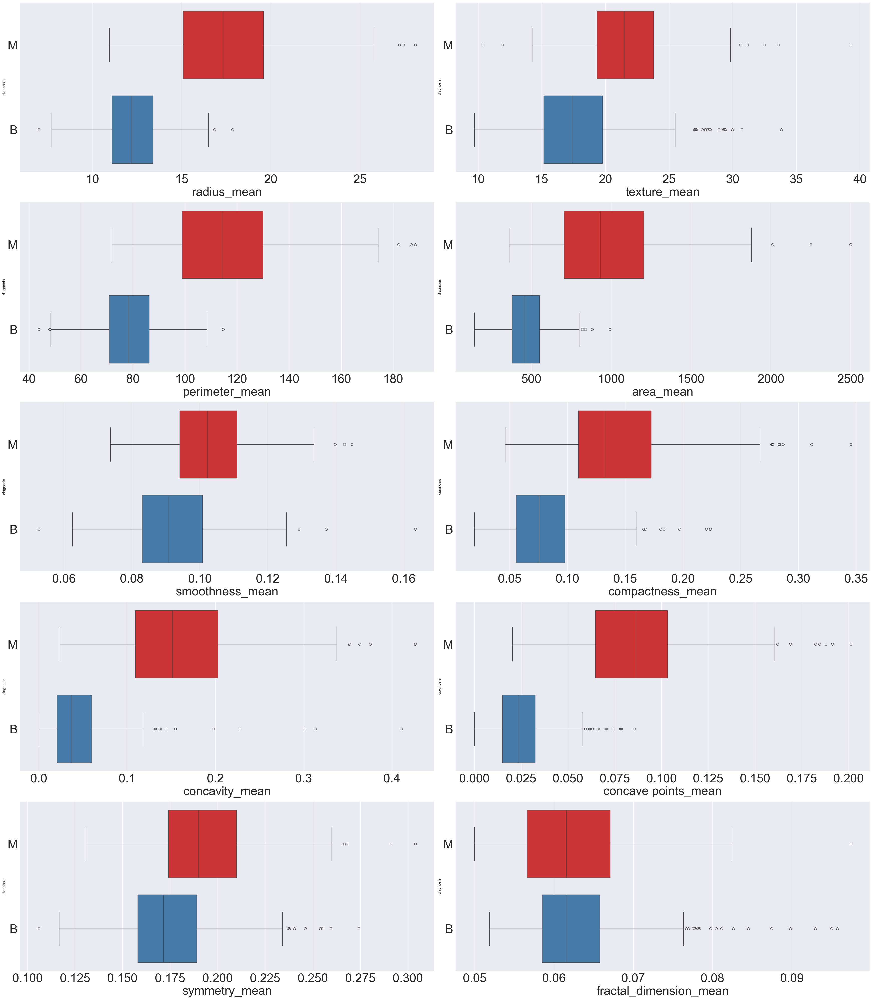

In [8]:
fig,axs=plt.subplots(ncols=2,nrows=5,figsize=(35,40),dpi=100)
axs=axs.flatten()

for i,col in enumerate(df_1.drop(columns="diagnosis").columns):
    sns.boxplot(x=col,y="diagnosis",data=df_1,ax=axs[i],palette="Set1")
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis="x",labelsize=35)
    axs[i].tick_params(axis="y",labelsize=35)

plt.tight_layout()
plt.show()

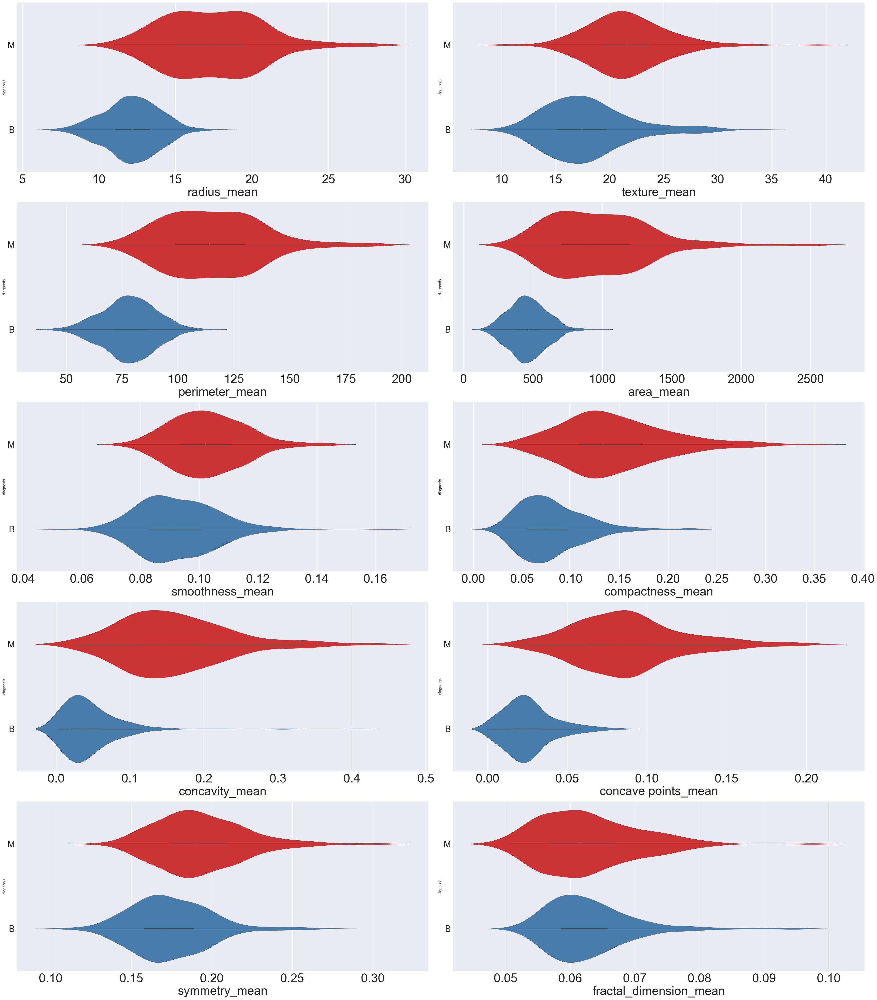

In [9]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_1.drop(columns = 'diagnosis').columns) :
    sns.violinplot(x = col,y='diagnosis',data = df_1, ax=axs[i], palette="Set1")
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)
    
plt.tight_layout()
plt.show()

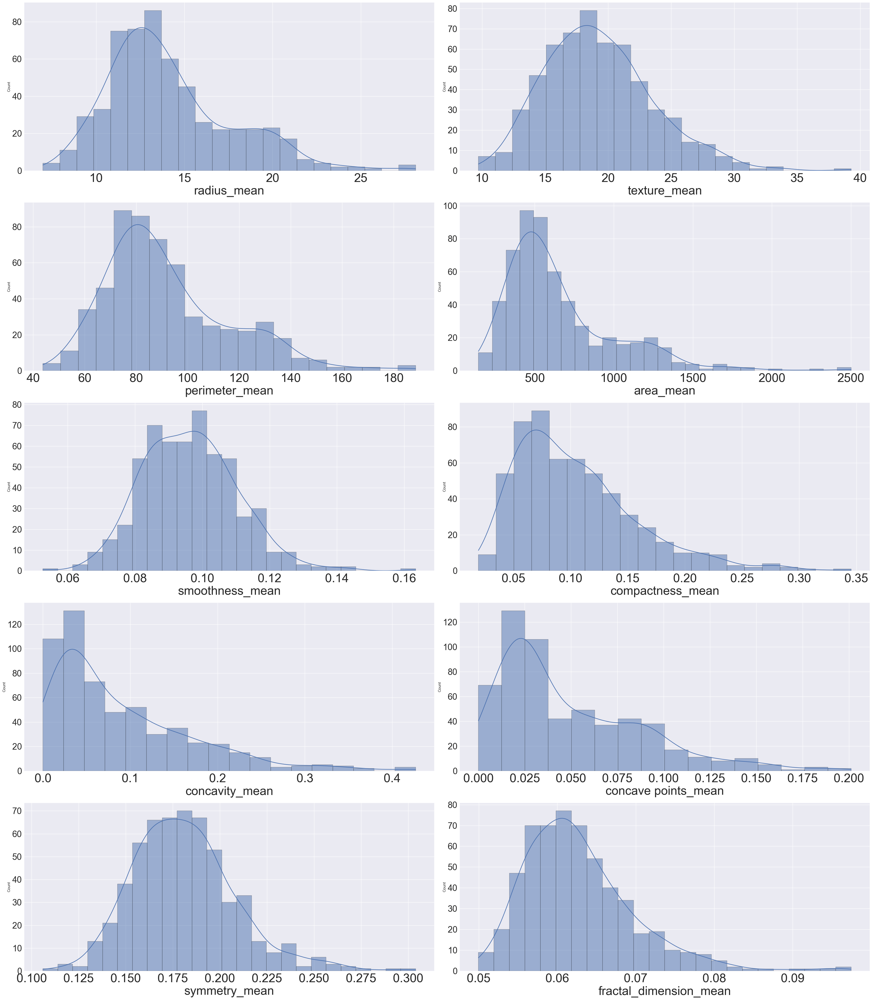

In [10]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_1.drop(columns = 'diagnosis').columns) :
    sns.histplot(x = col,data = df_1 ,kde=True, ax=axs[i],palette="Set1")
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)
    
plt.tight_layout()
plt.show()

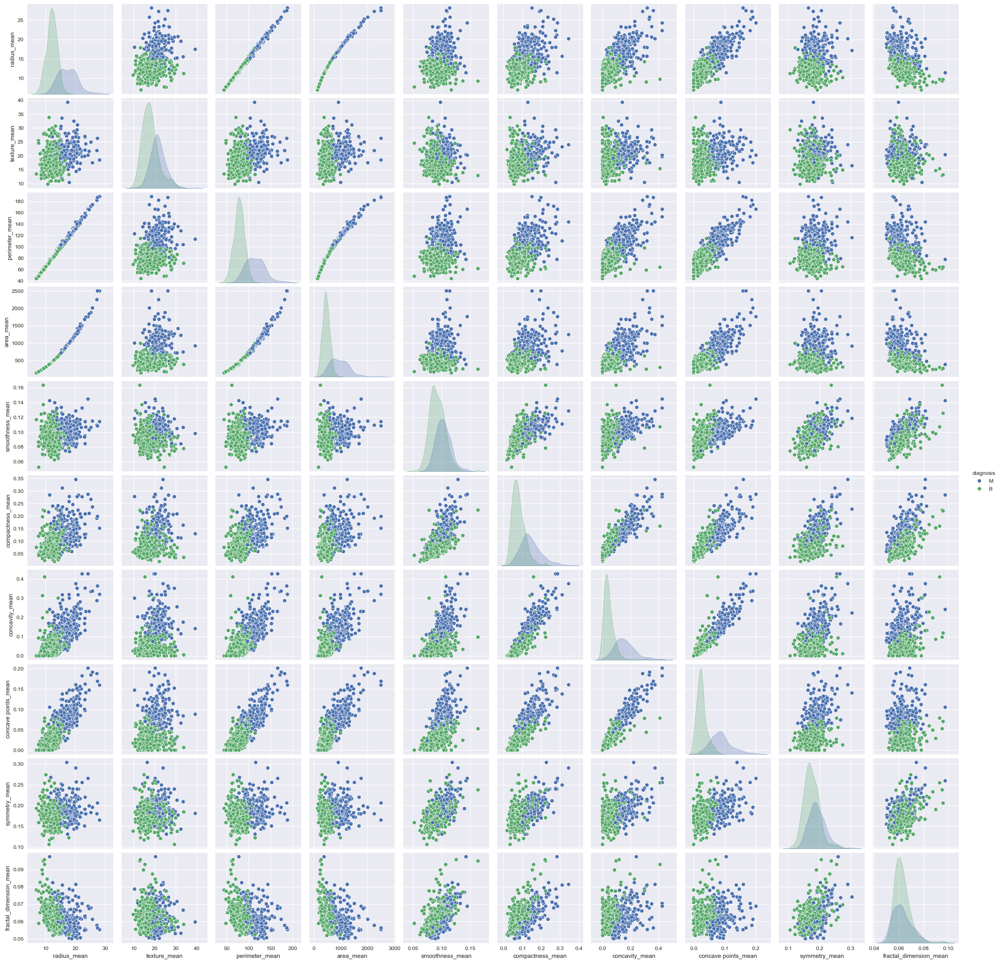

In [11]:
sns.pairplot(df_1,hue="diagnosis",diag_kind="kde",height=2.5)

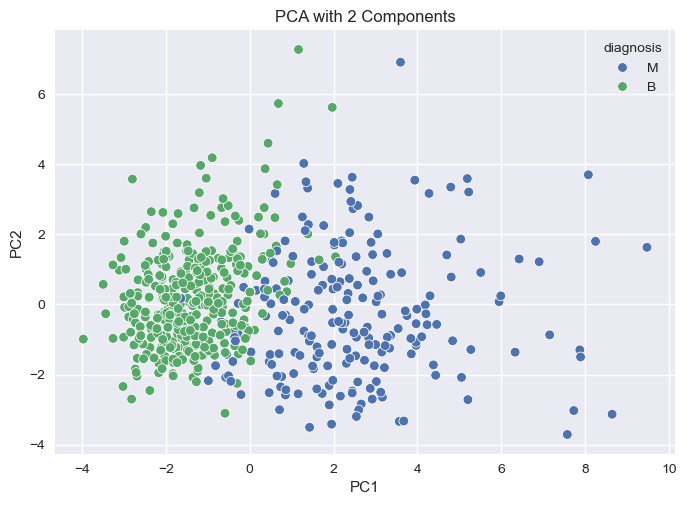

In [12]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X = df_1.drop(columns=['diagnosis'])
X_scaled = StandardScaler().fit_transform(X)

# PCA ile 2 bileşenli dönüşüm
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
df_pca = pd.DataFrame(data=principal_components, columns=["PC1", "PC2"])
df_pca['diagnosis'] = df_1['diagnosis']

# Görselleştirme
sns.scatterplot(x="PC1", y="PC2", hue="diagnosis", data=df_pca)
plt.title('PCA with 2 Components')
plt.show()

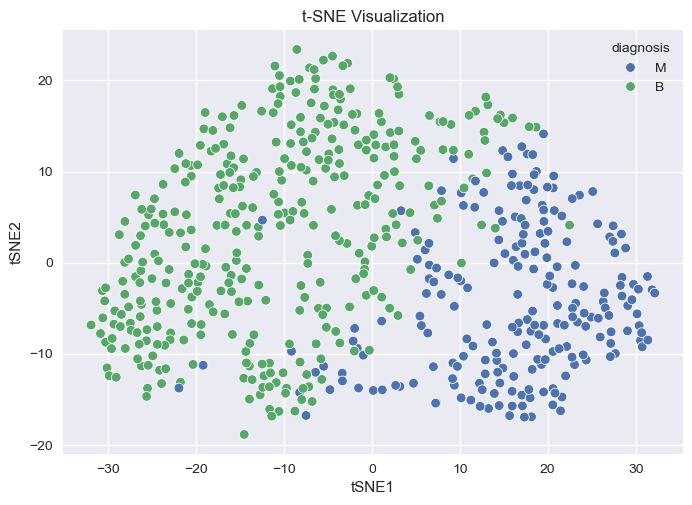

In [13]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(X_scaled)
df_tsne = pd.DataFrame(data=tsne_results, columns=["tSNE1", "tSNE2"])
df_tsne['diagnosis'] = df_1['diagnosis']

sns.scatterplot(x="tSNE1", y="tSNE2", hue="diagnosis", data=df_tsne)
plt.title('t-SNE Visualization')
plt.show()

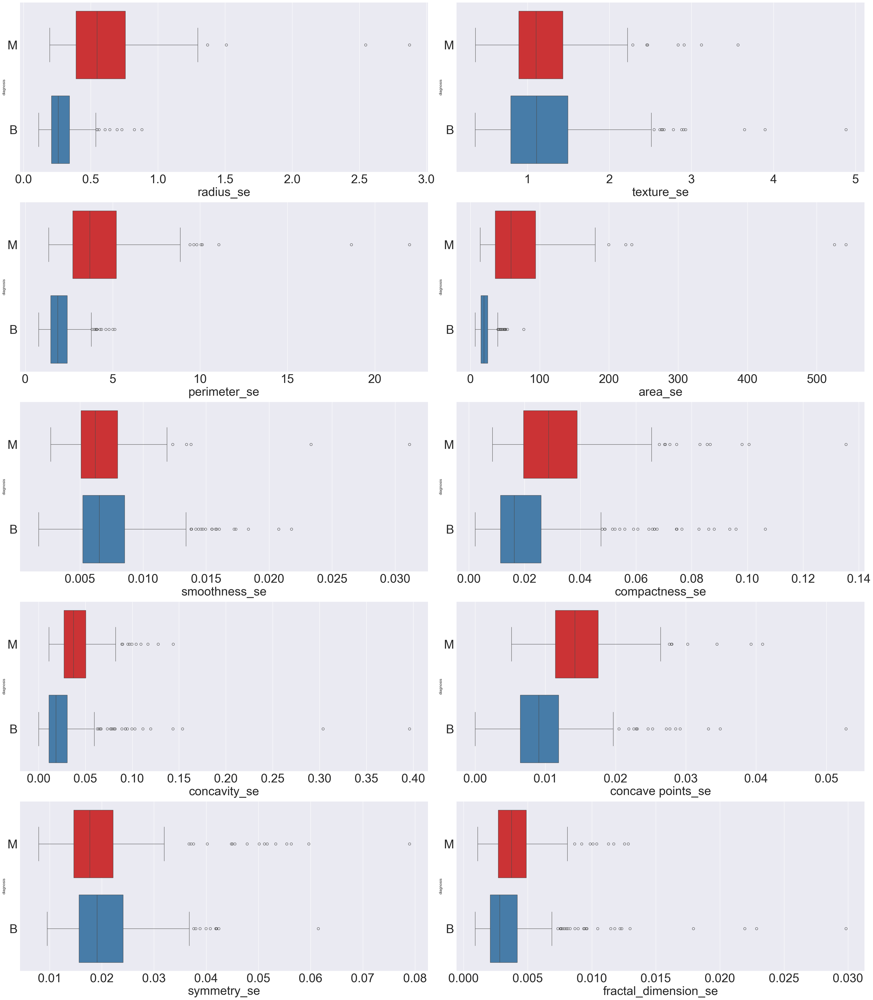

In [14]:
fig,axs=plt.subplots(ncols=2,nrows=5,figsize=(35,40),dpi=100)
axs=axs.flatten()

for i,col in enumerate(df_2.drop(columns="diagnosis").columns):
    sns.boxplot(x=col,y="diagnosis",data=df_2,ax=axs[i],palette="Set1")
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis="x",labelsize=35)
    axs[i].tick_params(axis="y",labelsize=35)

plt.tight_layout()
plt.show()

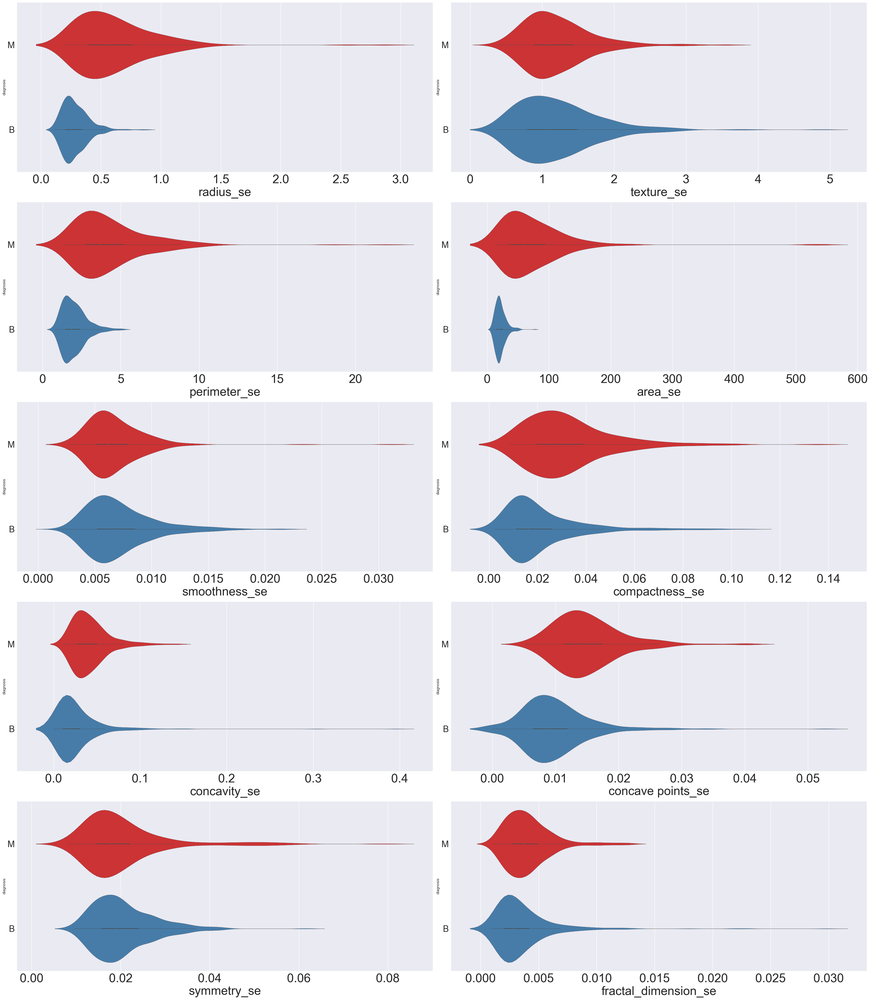

In [15]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_2.drop(columns = 'diagnosis').columns) :
    sns.violinplot(x = col,y='diagnosis',data = df_2, ax=axs[i], palette="Set1")
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)
    
plt.tight_layout()
plt.show()

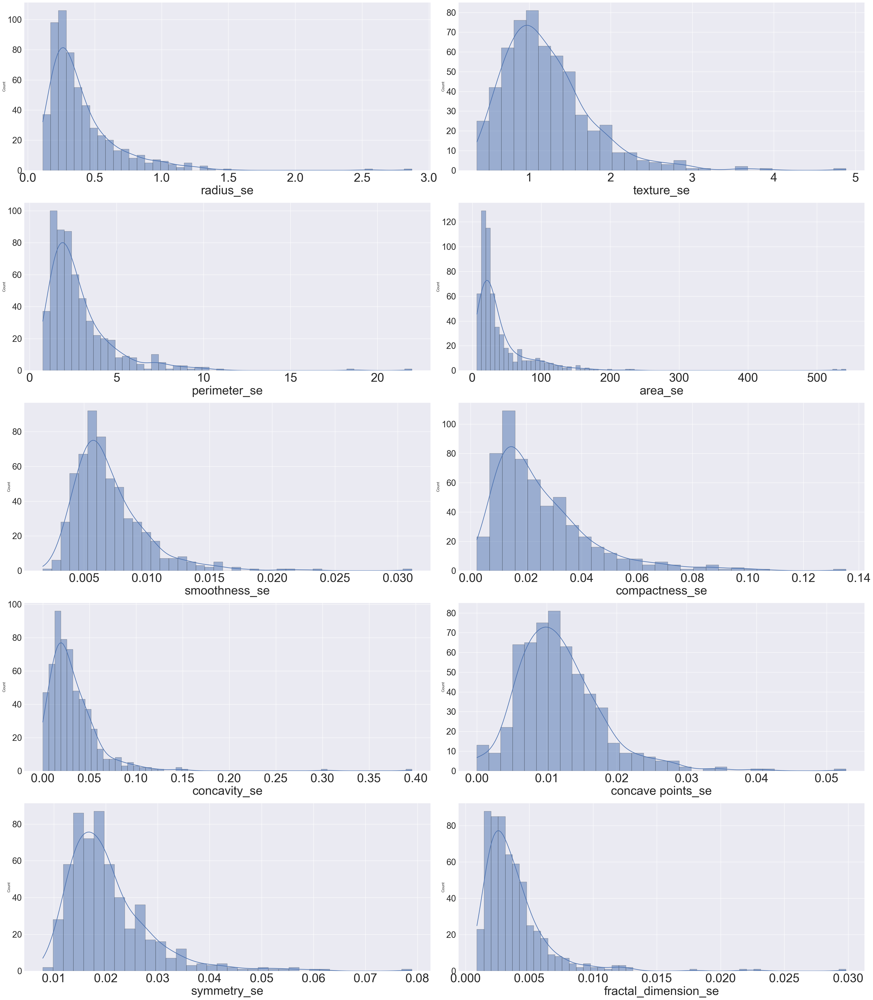

In [16]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_2.drop(columns = 'diagnosis').columns) :
    sns.histplot(x = col,data = df_2 ,kde=True, ax=axs[i],palette="Set1")
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)
    
plt.tight_layout()
plt.show()

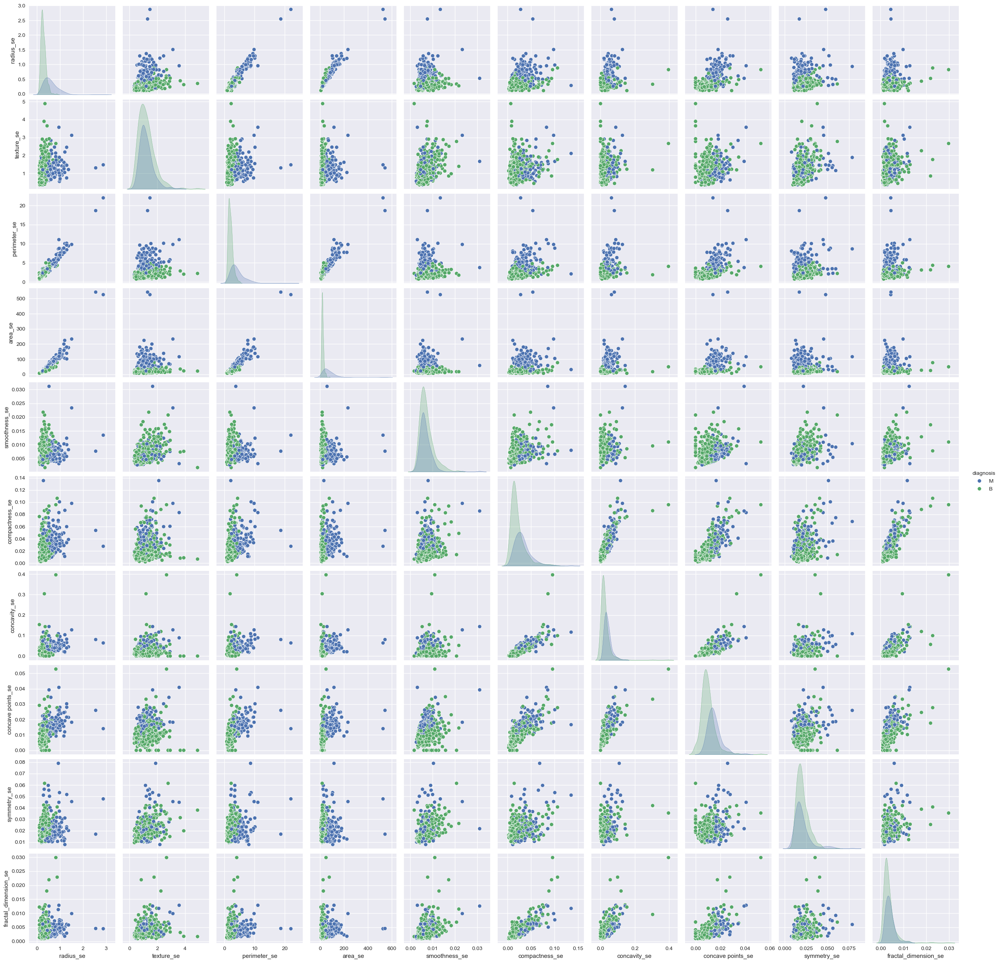

In [17]:
sns.pairplot(df_2,hue="diagnosis",diag_kind="kde",height=2.5)

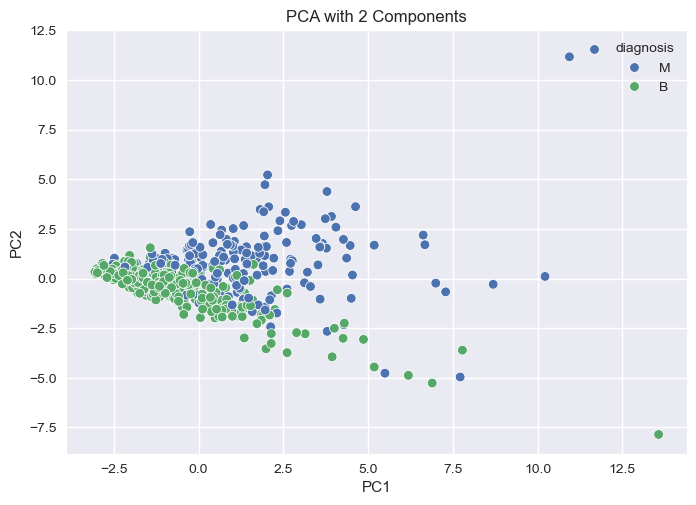

In [18]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X = df_2.drop(columns=['diagnosis'])
X_scaled = StandardScaler().fit_transform(X)

# PCA ile 2 bileşenli dönüşüm
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
df_pca = pd.DataFrame(data=principal_components, columns=["PC1", "PC2"])
df_pca['diagnosis'] = df_2['diagnosis']

# Görselleştirme
sns.scatterplot(x="PC1", y="PC2", hue="diagnosis", data=df_pca)
plt.title('PCA with 2 Components')
plt.show()

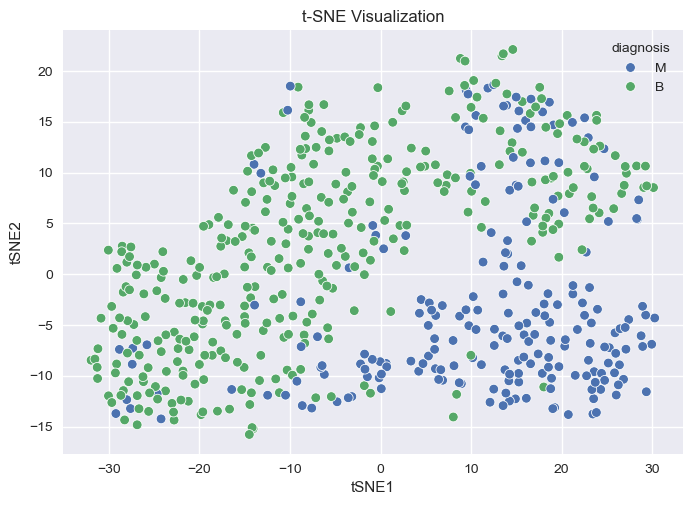

In [19]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(X_scaled)
df_tsne = pd.DataFrame(data=tsne_results, columns=["tSNE1", "tSNE2"])
df_tsne['diagnosis'] = df_2['diagnosis']

sns.scatterplot(x="tSNE1", y="tSNE2", hue="diagnosis", data=df_tsne)
plt.title('t-SNE Visualization')
plt.show()

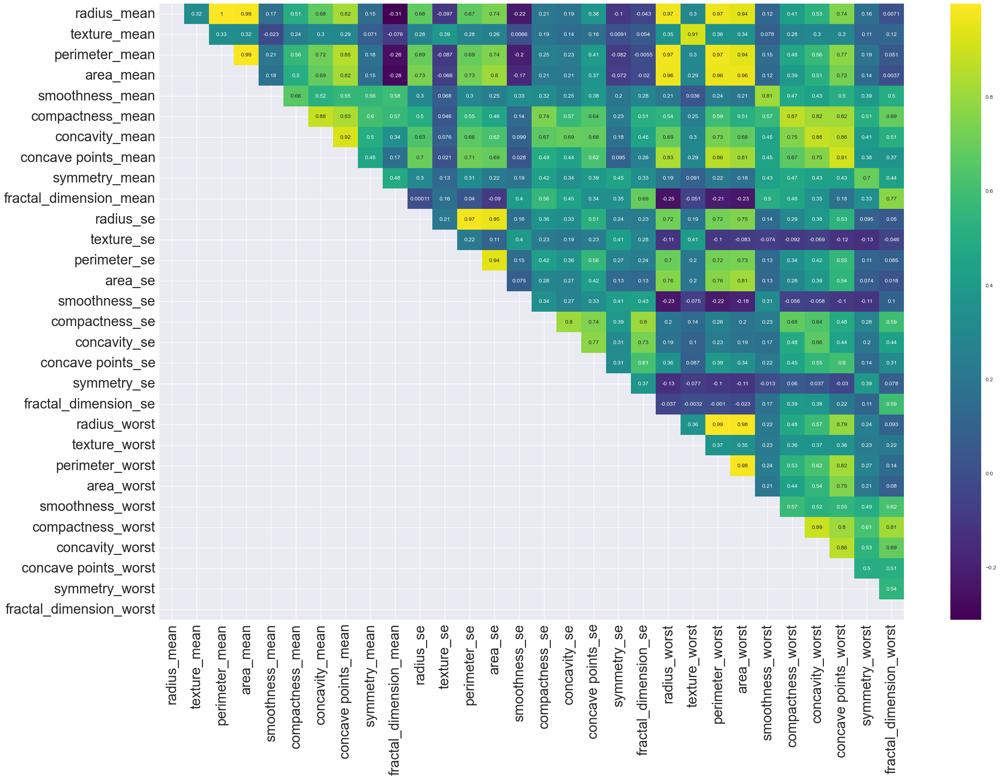

In [20]:
numeric_df = df.select_dtypes(include=['number'])
plt.figure(figsize=(30,20))
sns.heatmap(numeric_df.corr(), cmap='viridis', annot=True, mask=np.tril(np.ones_like(numeric_df.corr(), dtype=bool)))
plt.xticks(fontsize=25, rotation=90)
plt.yticks(fontsize=25, rotation=0)
plt.show()


diagnosis
B    357
M    212
Name: count, dtype: int64

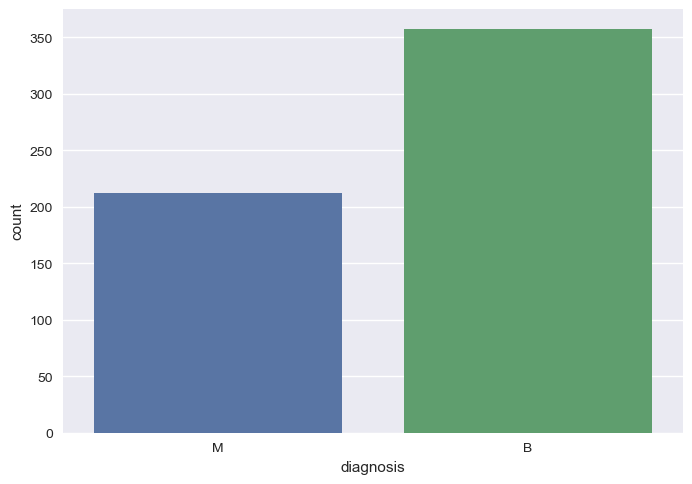

In [21]:
sns.countplot(x="diagnosis",hue="diagnosis",data=df)
df["diagnosis"].value_counts()

In [22]:
df["diagnosis"]=df["diagnosis"].replace({"M":1,"B":0})
scaler=preprocessing.StandardScaler()
x=df.drop(columns="diagnosis").values
x=scaler.fit_transform(x)
y=df["diagnosis"].values.reshape(-1,1)
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [25]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
#import xgboost as xgb
from sklearn.ensemble import AdaBoostClassifier

In [27]:
models=[LogisticRegression(random_state=42),KNeighborsClassifier(),
          SVC(probability=True, random_state=42),GaussianNB(),
          DecisionTreeClassifier(random_state=42),RandomForestClassifier(random_state=42),AdaBoostClassifier()]
model_names=['LogisticRegression','KNN','SVM','NaiveBayes','DecisionTree','RandomForest','AdaBoostClassifier']
auc_scores = []

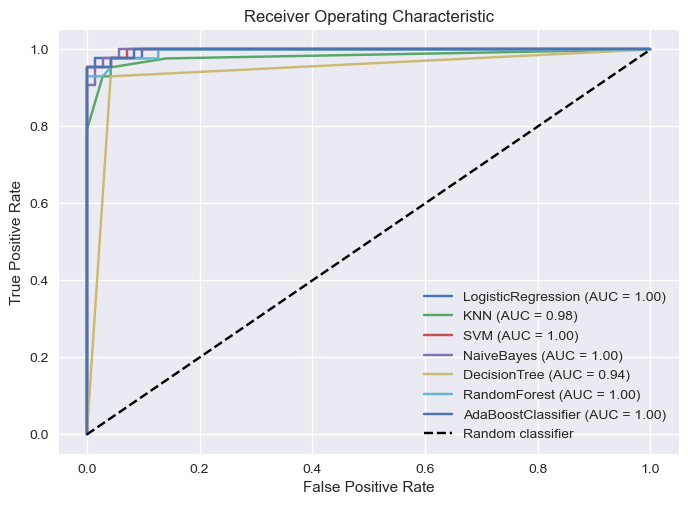

In [28]:
for model,name in zip(models,model_names): 
    model.fit(x_train,y_train)
    y_pred_prob = model.predict_proba(x_test)[:, 1]
    fpr,tpr,thresholds = roc_curve(y_test,y_pred_prob)
    auc_score = auc(fpr,tpr)
    auc_scores.append(auc_score)
    plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, auc_score))
    
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

In [29]:
from sklearn.metrics import precision_score, recall_score, f1_score
f1_scores = []
recall = []
precision = []

for model, name in zip(models, model_names):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    f1 = f1_score(y_test, y_pred)
    r = recall_score(y_test,y_pred)
    p = precision_score(y_test,y_pred)
    f1_scores.append(f1)
    recall.append(r)
    precision.append(p)
    print('%s: F1-score = %0.3f' % (name, f1))
    print('%s: Precision = %0.3f' % (name, p))
    print('%s: Recall = %0.3f' % (name, r))
    print('\n')
    



average_f1_score = sum(f1_scores) / len(f1_scores)
print('Average F1-score:', average_f1_score)

LogisticRegression: F1-score = 0.965
LogisticRegression: Precision = 0.976
LogisticRegression: Recall = 0.953


KNN: F1-score = 0.930
KNN: Precision = 0.930
KNN: Recall = 0.930


SVM: F1-score = 0.965
SVM: Precision = 0.976
SVM: Recall = 0.953


NaiveBayes: F1-score = 0.952
NaiveBayes: Precision = 0.976
NaiveBayes: Recall = 0.930


DecisionTree: F1-score = 0.930
DecisionTree: Precision = 0.930
DecisionTree: Recall = 0.930


RandomForest: F1-score = 0.952
RandomForest: Precision = 0.976
RandomForest: Recall = 0.930


AdaBoostClassifier: F1-score = 0.965
AdaBoostClassifier: Precision = 0.976
AdaBoostClassifier: Recall = 0.953


Average F1-score: 0.9513349525856855


normaly best model for our data is logistic regresion bu ı want to do KNN

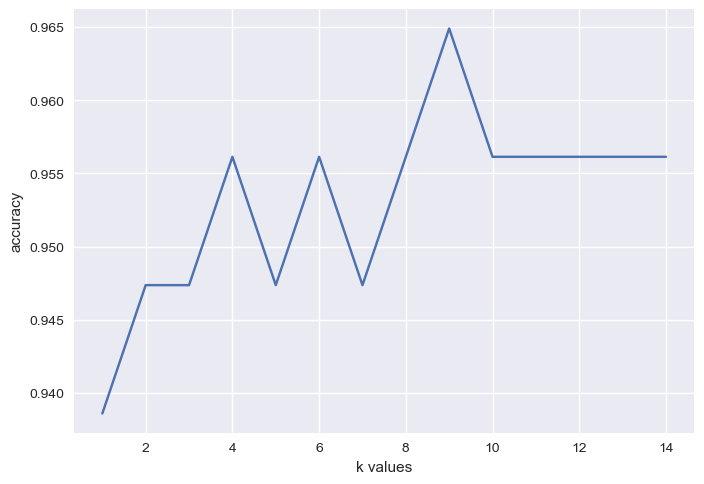

In [30]:
from sklearn.neighbors import KNeighborsClassifier
score_list=[]
for each in range(1,15):
    knn2=KNeighborsClassifier(n_neighbors=each)
    knn2.fit(x_train,y_train)
    score_list.append(knn2.score(x_test,y_test))

plt.plot(range(1,15),score_list)
plt.xlabel("k values")
plt.ylabel("accuracy")
plt.show()    

Accursy score
-------------
9 nn ACC score 0.9649122807017544
---------------




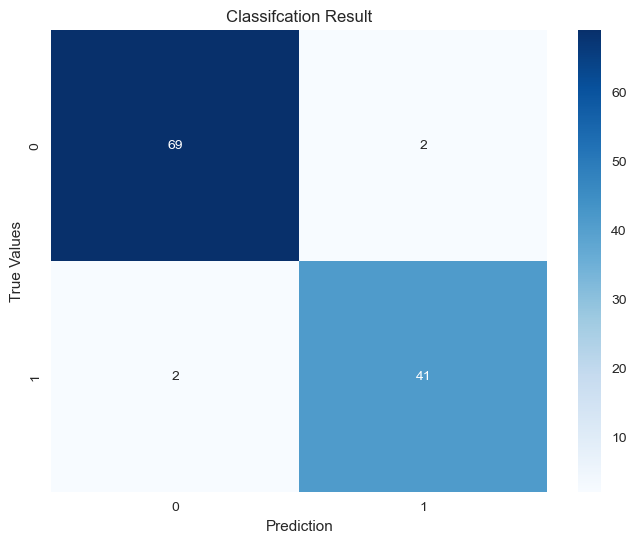



Result Evaluation
------------------------
Sum True Prediction: 110

Sum False Prediction: 4



In [31]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
knn=KNeighborsClassifier(n_neighbors=9)
knn.fit(x_train,y_train)
prediction=knn.predict(x_test)
print("Accursy score")
print("-------------")
print("{} nn ACC score {}".format(9,knn.score(x_test,y_test)))
print("---------------\n\n")
cm = confusion_matrix(y_test, prediction.reshape(-1))
plt.figure(figsize=(8,6))
sns.heatmap(cm,annot=True,fmt="d",cmap="Blues",xticklabels=np.unique(y_test),yticklabels=np.unique(y_test))
plt.xlabel('Prediction')
plt.ylabel('True Values')
plt.title('Classifcation Result')
correct_pred=np.trace(cm)
total_pred=np.sum(cm)
incorrect_pred=total_pred-correct_pred
plt.show()
print("\n")
print("Result Evaluation")
print("------------------------")
print(f'Sum True Prediction: {correct_pred}\n')
print(f'Sum False Prediction: {incorrect_pred}\n')
